# Find Inference Hyperparameters for Individual 40 in Lung Cancer Control Group

## Show control group data

In [1]:
import erlotinib as erlo

# Get data
data = erlo.DataLibrary().lung_cancer_control_group()

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in 8 mice with patient-derived lung cancer implants.

## Build model

In [2]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})

# Define error model
error_model = erlo.GaussianErrorModel()

# Compose model and not identified parameters
problem = erlo.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0})

## Prior Predictive Check

In [3]:
import numpy as np
import pints

# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.25, sd=0.1, a=0, b=np.inf),   # Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Critical volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf),    # Growth rate
    pints.TruncatedGaussianLogPrior(mean=0.5, sd=0.2, a=0, b=1)]         # Sigma
log_prior = pints.ComposedLogPrior(*log_priors)

# Compose prior predictive model
predictive_model = problem.get_predictive_model()
prior_predictive_model = erlo.PriorPredictiveModel(
    predictive_model, log_prior)

# Sample from prior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = prior_predictive_model.sample(times, n_samples)

# Illustrate prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 2:** Prior predictive model of tumour volume measurement over time. The shaded areas estimate the 0.3, 0.6 and 0.9 bulk probability of the prior predictive distribution by sampling 1000 virtual "measurements" at each of the 50 equidistant time points.

## Find posterior probability distribution

## Find hyperparameters for good convergence

In [118]:
# Create log-posteriors
problem.set_data(data, output_biomarker_dict={'myokit.tumour_volume': 'Tumour volume'})
problem.set_log_prior(log_priors)
log_posteriors = problem.get_log_posterior(individual='40')

# Set up sampling controller
np.random.seed(1)
sampler = erlo.SamplingController(log_posteriors)
sampler.set_sampler(pints.HamiltonianMCMC)
transform = pints.ComposedTransformation(
    pints.LogTransformation(n_parameters=problem.get_n_parameters() - 1),
    pints.LogitTransformation(n_parameters=1))
sampler.set_transform(transform=transform)
sampler.set_n_runs(5)

# Run sampling
n_iterations = 40000
hyperparameters = [10, [0.1, 0.15, 0.15, 0.2]]
posterior_samples = sampler.run(
    n_iterations=n_iterations, hyperparameters=hyperparameters, show_progress_bar=True)

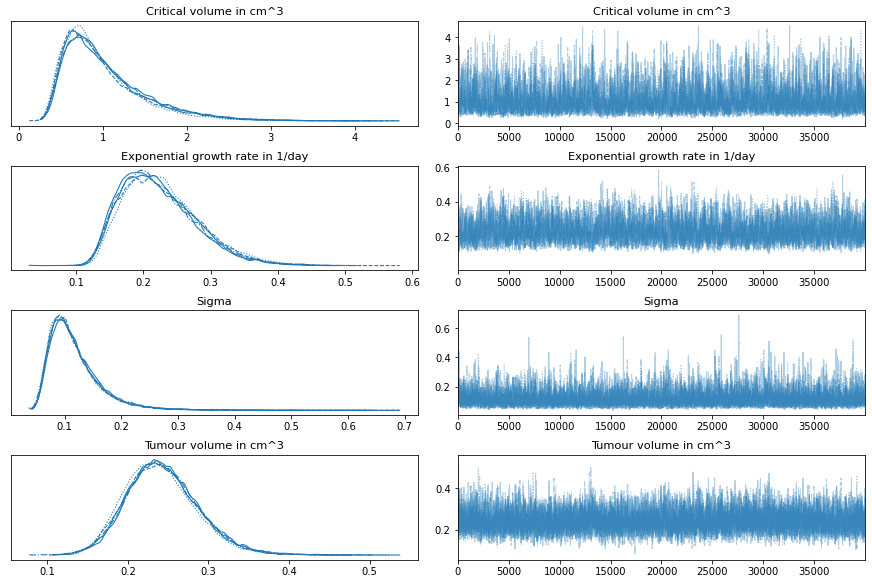

In [119]:
import arviz as az
import matplotlib.pyplot as plt

az.plot_trace(posterior_samples, coords={'individual': ['ID 40']})
plt.show()

In [120]:
sampler.get_divergent_iterations()

[[array([ 7693, 11870, 11871, 15218, 15220, 15221, 15222, 15223, 15225,
         15226, 15227, 15228, 15229, 15230, 15231, 15232, 15233, 15234,
         15235, 15236, 15238, 15239, 15241, 15243, 15244, 15245, 15246,
         15247, 15248, 15249, 15251, 18923, 33119, 33120, 33122, 35350,
         36095, 38402]),
  array([ 6765, 13196, 14364, 14600, 16077, 16080, 19920, 21564, 26601,
         30054, 34129, 38760]),
  array([ 3121,  3126, 12929, 13967, 14867, 22403, 22620, 23416, 27462,
         37706]),
  array([ 2916,  2995,  2996,  2997,  3375,  6182,  6394,  6400,  6405,
         14270, 14273, 15143, 17263, 20732, 27688, 31184, 34711, 36998,
         37001, 37277]),
  array([ 5169,  7811, 12083, 17961, 19838, 25400, 31105, 36707])]]

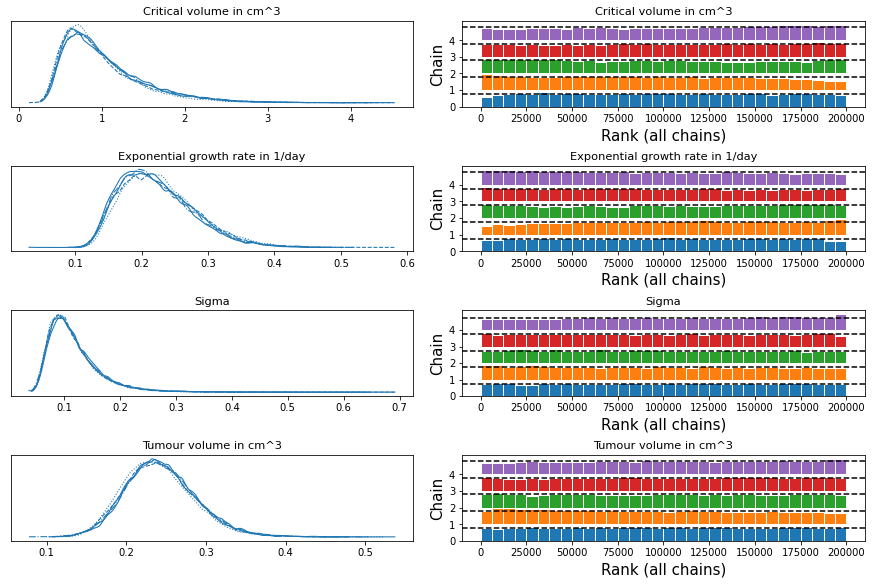

In [121]:
az.plot_trace(posterior_samples, coords={'individual': ['ID 40']}, kind='rank_bars')
plt.show()

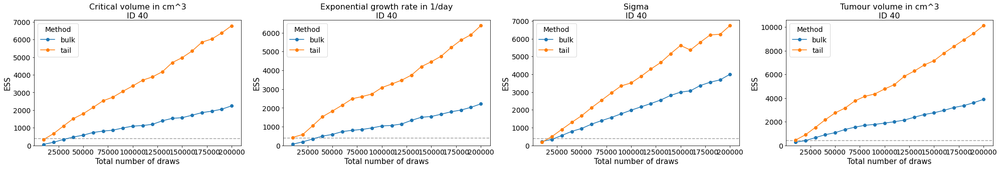

In [122]:
az.plot_ess(posterior_samples, coords={'individual': ['ID 40']}, kind="evolution")
plt.show()

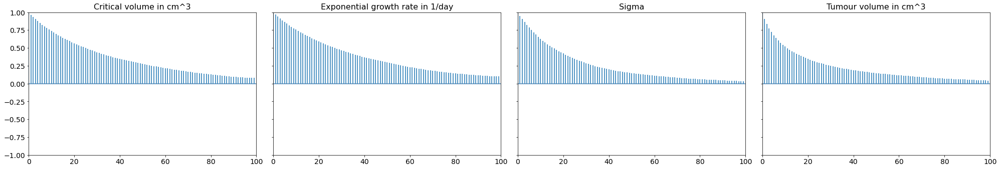

In [123]:
az.plot_autocorr(posterior_samples.sel(individual='ID 40'), combined=True)
plt.show()

### Exclude warmup

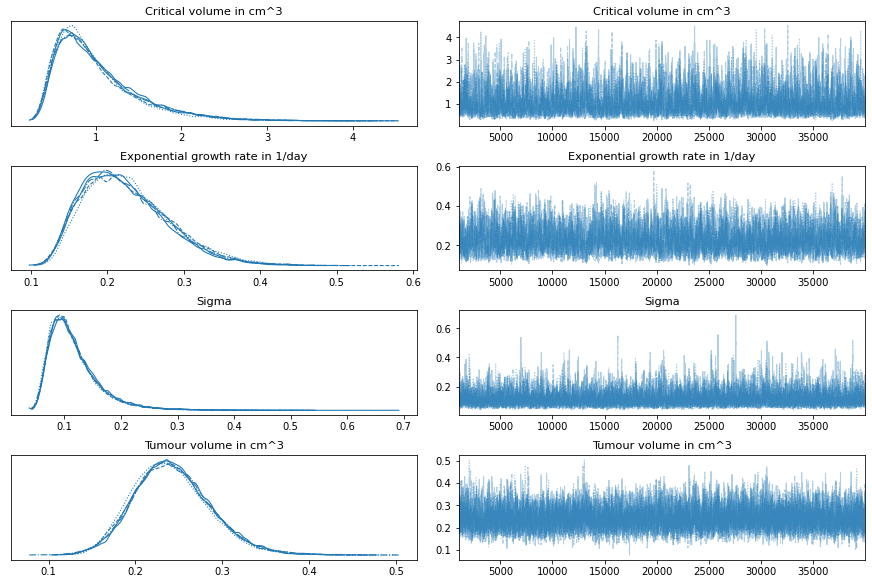

In [124]:
warmup = 1000

az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)), coords={'individual': ['ID 40']})
plt.show()

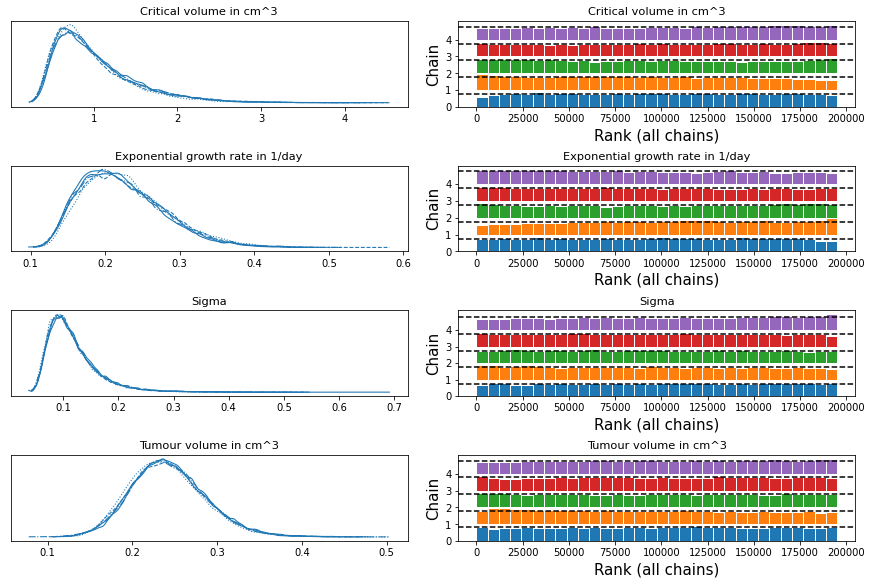

In [125]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)), coords={'individual': ['ID 40']}, kind='rank_bars')
plt.show()

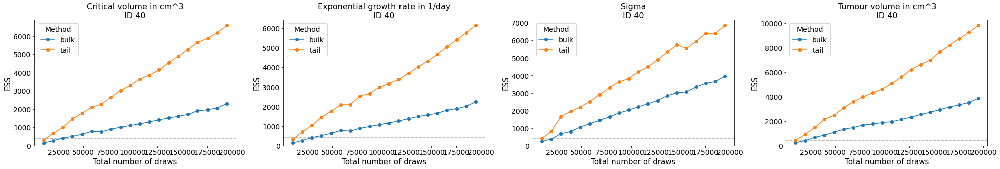

In [126]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations)), coords={'individual': ['ID 40']}, kind="evolution")
plt.show()

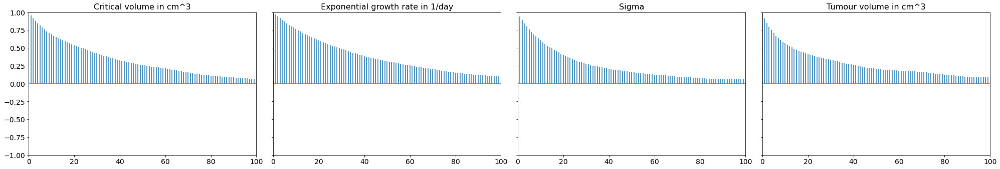

In [127]:
az.plot_autocorr(test.sel(draw=slice(warmup, n_iterations), individual='ID 40'), combined=True)
plt.show()

### Reduce correlations by thinning out

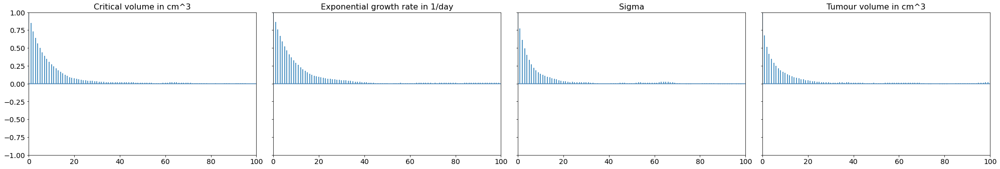

In [135]:
thinning_ratio = 5

az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio), individual='ID 40'), combined=True)
plt.show()

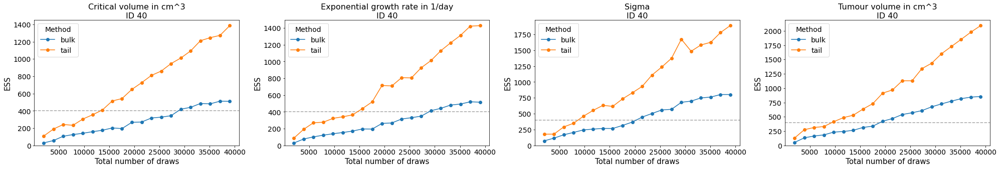

In [136]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), coords={'individual': ['ID 40']}, kind="evolution")
plt.show()

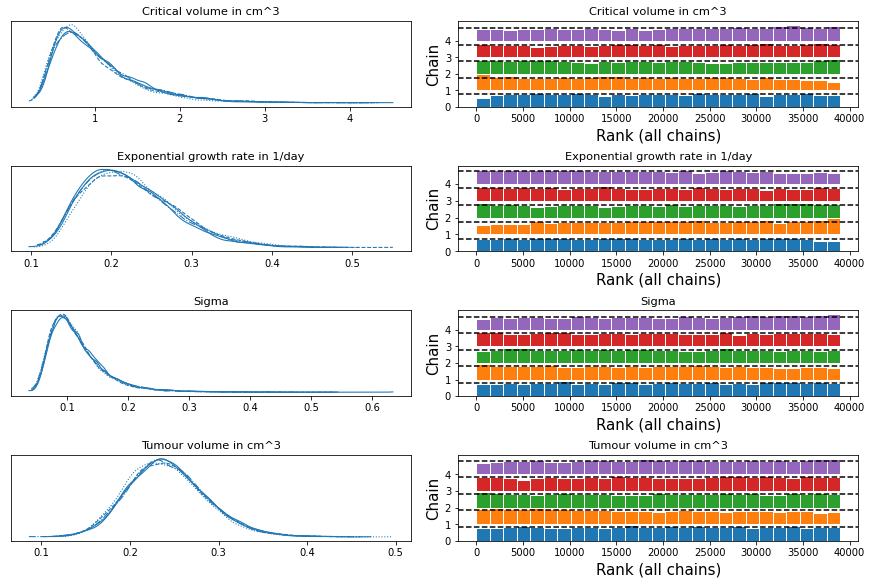

In [137]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), coords={'individual': ['ID 40']}, kind='rank_bars')
plt.show()

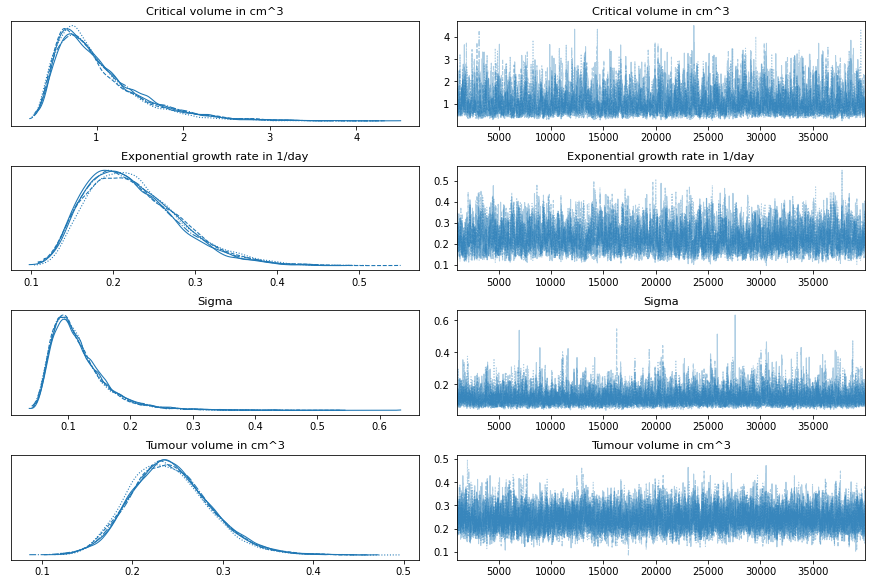

In [138]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), coords={'individual': ['ID 40']})
plt.show()

## Save posterior

In [141]:
import os

# Rename parameters
temp = posterior_samples.rename({
    'Tumour volume in cm^3': 'initial_tumour_volume',
    'Critical volume in cm^3': 'critical_volume',
    'Exponential growth rate in 1/day': 'growth_rate',
    'Sigma': 'sigma'})

# Export samples
directory = os.getcwd()
name = '/posteriors/id_40_hmc.nc'
temp.sel(draw=slice(warmup, n_iterations, thinning_ratio)).to_netcdf(directory + name)

### Joint 2 dimensional posterior distributions

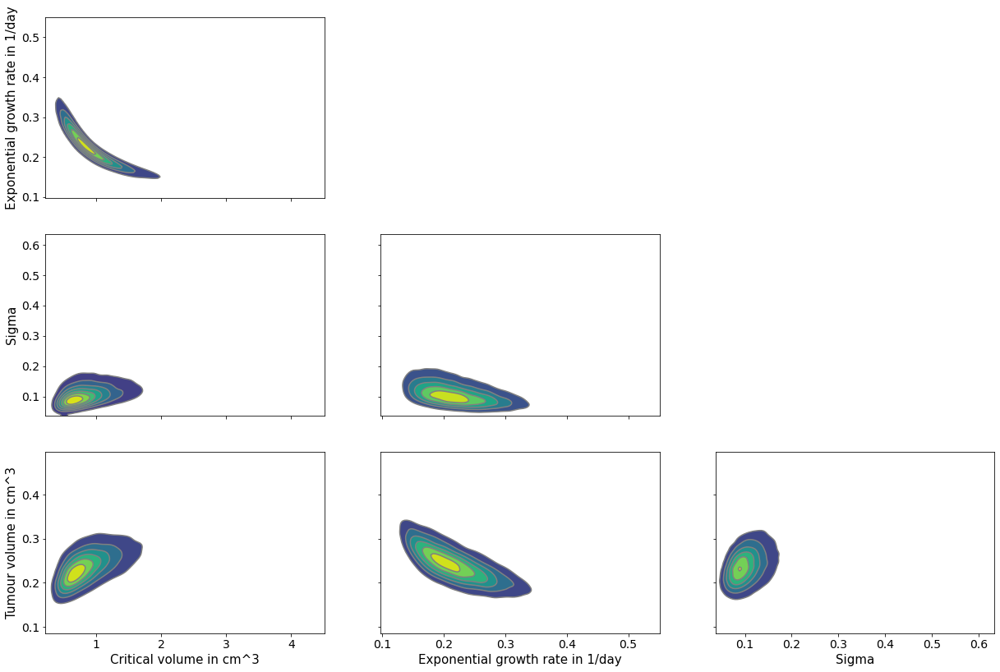

In [143]:
az.plot_pair(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), coords={'individual': ['ID 40']}, kind='kde')
plt.show()